코드 3-1

In [1]:
!pip install git+https://github.com/openai/CLIP.git
!pip install ftfy regex tqdm
!pip install torch torchvision

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-5vt7npbz
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-5vt7npbz
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.4 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=36d59e851c109e27fe577b19b70831bff6704da2abe540f6292ffaa525a69cd8
  Stored in directory: /tmp/pip-ephem-wheel-cache-4wv1btu3/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip


In [6]:
import torch
torch.cuda.is_available()

True

In [22]:
import clip
import torch
from PIL import Image

# 1. 모델 로딩
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# 2. 입력 텍스트 및 이미지
texts = ["a photo of a dog", "a photo of a cat"]
img = Image.open("dog.png")

# print(img)
# temp = preprocess(img)
# print(type(temp))
# print(temp.shape)
# temp = temp.unsqueeze(0)
# print(temp.shape)

image = preprocess(Image.open("dog.png")).unsqueeze(0).to(device)

# 3. 인코딩 수행
text_tokens = clip.tokenize(texts).to(device)
print(text_tokens)

# with torch.no_grad():
image_features = model.encode_image(image)

text_features = model.encode_text(text_tokens)

# print(len(image_features[0])
# print(len(image_features[0])

# 4. 유사도 계산
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = (100.0 * image_features @ text_features.T)
probs = similarity.softmax(dim=-1)

print("Matching Probabilities:", probs)


tensor([[49406,   320,  1125,   539,   320,  1929, 49407,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0],
        [49406,   320,  1125,   539,   320,  2368, 49407,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0, 

In [23]:
import clip
import torch
from PIL import Image
import torch.nn.functional as F

# 1. 모델 로딩 및 입력 준비
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

image = preprocess(Image.open("cat.png")).unsqueeze(0).to(device)
texts = clip.tokenize(["a photo of a cat", "a photo of a dog"]).to(device)

# 2. 임베딩 추출
with torch.no_grad():
    img_feat = model.encode_image(image)
    txt_feat = model.encode_text(texts)

# 3. 정규화 후 유사도 계산
img_feat = F.normalize(img_feat, dim=-1)
txt_feat = F.normalize(txt_feat, dim=-1)

# Cosine Similarity (정규화 후 Dot Product와 동일)
cos_sim = img_feat @ txt_feat.T  # shape: (1, 2)

# Euclidean Distance
eucl_dist = torch.norm(img_feat - txt_feat, dim=-1)

# 결과 출력
print("Cosine Similarity:", cos_sim)
print("Euclidean Distance:", eucl_dist)


Cosine Similarity: tensor([[0.2808, 0.2295]], device='cuda:0', dtype=torch.float16)
Euclidean Distance: tensor([1.1992, 1.2412], device='cuda:0', dtype=torch.float16)


코드 3-3

In [26]:
import clip
import torch
from PIL import Image
import os
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize

# 1. 모델 불러오기
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# 2. 이미지 목록 로딩
image_dir = "./images"
image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(".png")]

images = [preprocess(Image.open(p)).unsqueeze(0) for p in image_paths]
image_input = torch.cat(images).to(device)

# 3. 텍스트 입력 및 토큰화
texts = ["a photo of a dog"]
text_tokens = clip.tokenize(texts).to(device)

print(text_tokens)

# 4. 임베딩 추출
with torch.no_grad():
    image_features = model.encode_image(image_input)
    text_features = model.encode_text(text_tokens)

# 5. Cosine 유사도 계산
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarities = (100.0 * text_features @ image_features.T)  # (1, N)

# 6. 가장 유사한 이미지 선택
best_match_index = similarities.argmax().item()
print(f"Best match: {image_paths[best_match_index]}")


tensor([[49406,   320,  1125,   539,   320,  1929, 49407,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], device='cuda:0',
       dtype=torch.int32)
Best match: ./images/dog.png


코드 3-4


입력 문장: "a photo of a dog"

검색된 이미지:


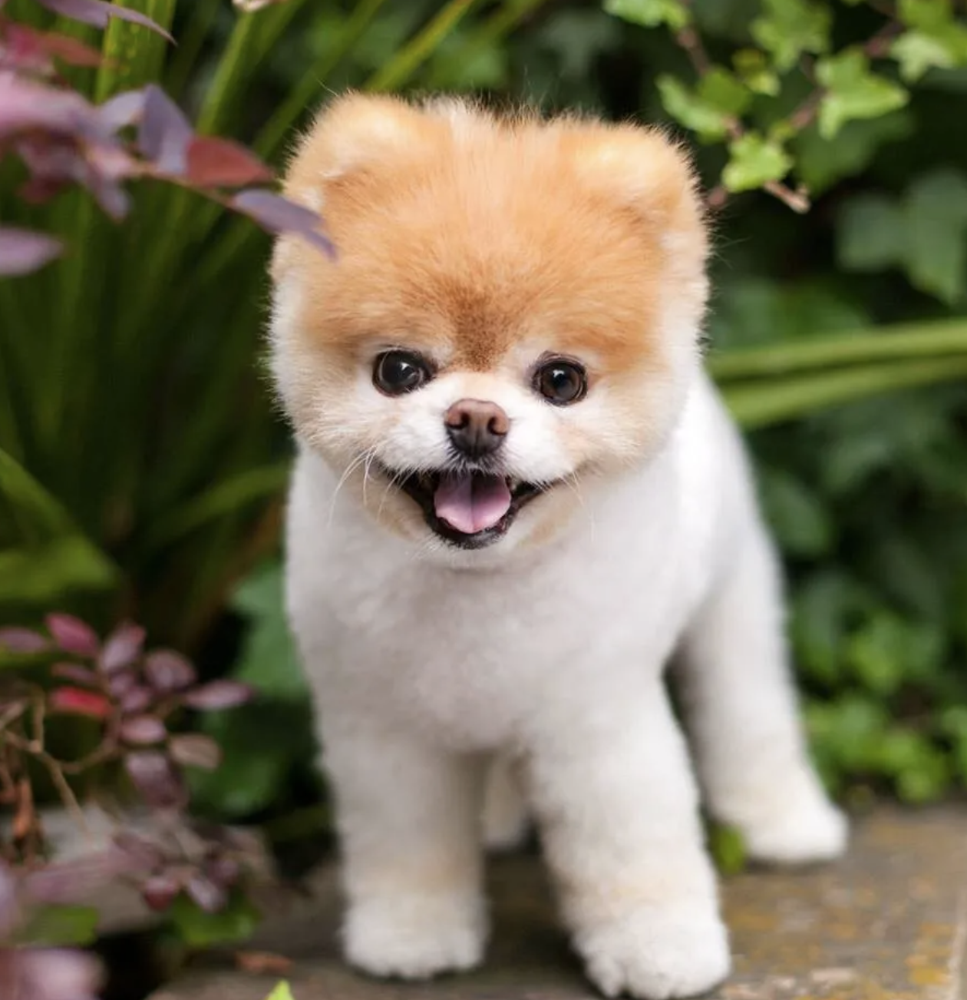

→ dog.png (유사도: 28.469)


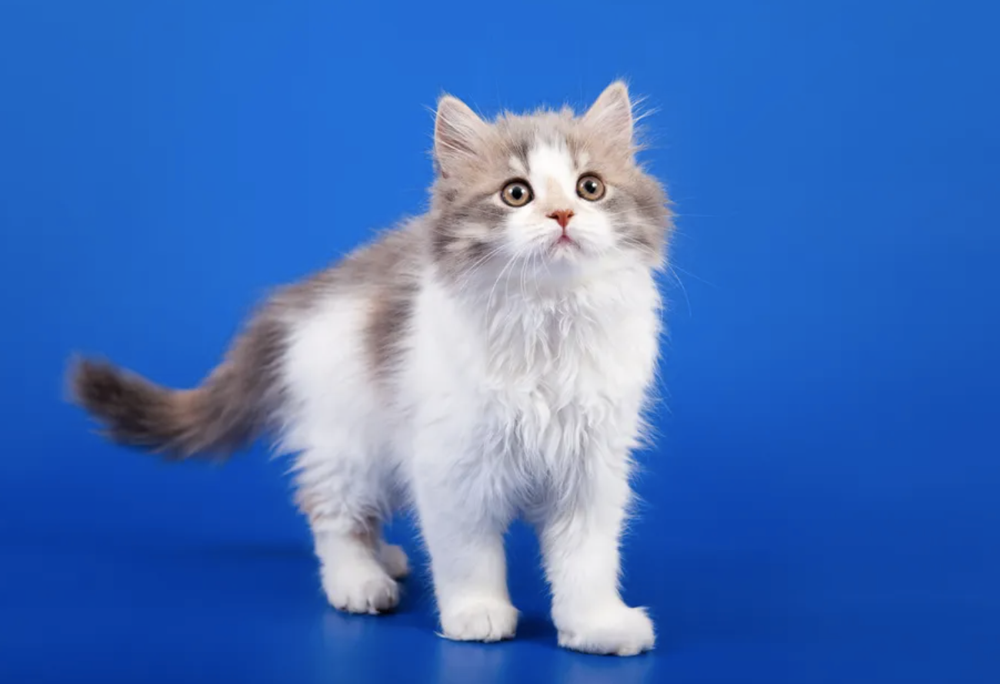

→ cat.png (유사도: 22.953)


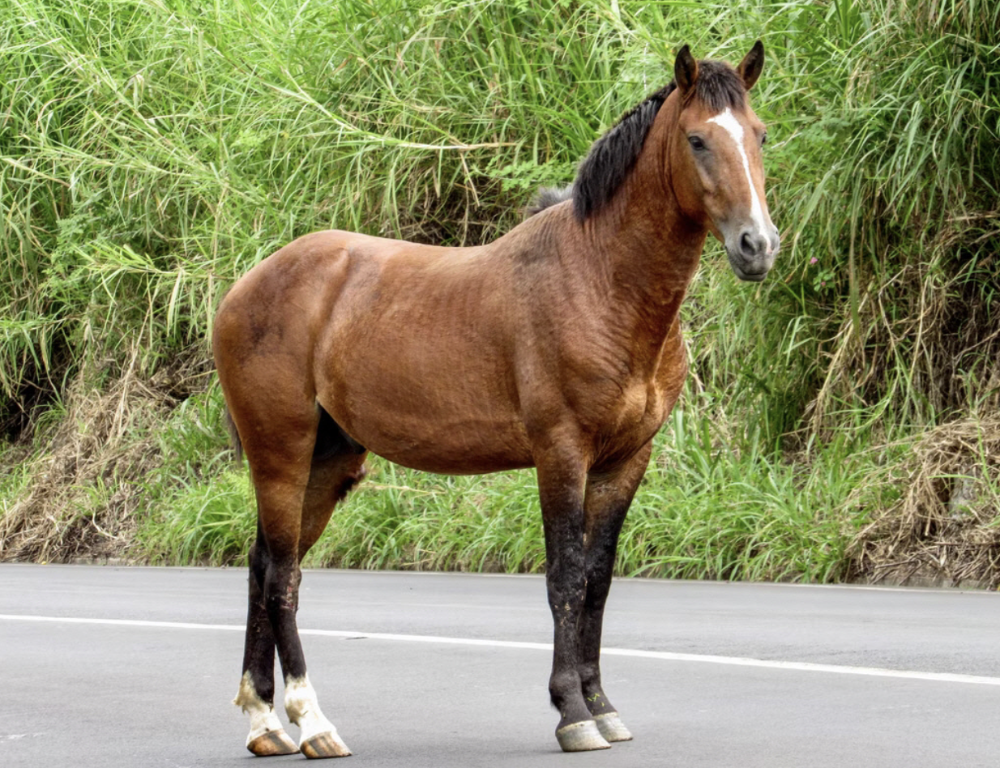

→ horse.png (유사도: 22.031)


In [29]:
import clip
import torch
from PIL import Image
import os
from IPython.display import display

# 1. 모델 로딩 및 장치 설정
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# 2. 이미지 폴더 설정
image_dir = "./images"
image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(".png") or f.endswith(".jpg")]

# 3. 이미지 임베딩 미리 계산
image_tensors = [preprocess(Image.open(p)).unsqueeze(0).to(device) for p in image_paths]
image_input = torch.cat(image_tensors)
with torch.no_grad():
    image_features = model.encode_image(image_input)
    image_features /= image_features.norm(dim=-1, keepdim=True)

# 4. 텍스트 입력 및 유사도 계산
query = "a photo of a dog"  # 사용자 입력
text_token = clip.tokenize([query]).to(device)

with torch.no_grad():
    text_feature = model.encode_text(text_token)
    text_feature /= text_feature.norm(dim=-1, keepdim=True)

similarities = (100.0 * text_feature @ image_features.T).squeeze()

# 5. Top-3 이미지 검색 결과 출력
top_k = similarities.topk(3).indices
print(f"\n입력 문장: \"{query}\"\n")
print("검색된 이미지:")
for i in top_k:
    display(Image.open(image_paths[i]))
    print(f"→ {os.path.basename(image_paths[i])} (유사도: {similarities[i].item():.3f})")


코드 3-5

In [30]:
!pip install transformers torchvision accelerate

In [36]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image
import torch

# 1. 모델 및 프로세서 로딩
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# 2. 이미지 불러오기 (파일 경로 수정 필요)
image = Image.open("/content/group.png").convert("RGB")

# 3. 입력 전처리 및 캡션 생성
inputs = processor(images=image, return_tensors="pt").to(device)
out = model.generate(**inputs)

# 4. 출력 해석
caption = processor.decode(out[0], skip_special_tokens=True)
print("📸 이미지 설명:", caption)


📸 이미지 설명: a group of men sitting at a table in front of a sign


코드 3-6

In [37]:
import clip
import torch
from PIL import Image
import os

# 1. 모델 로딩
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# 2. 입력 이미지 불러오기
image = preprocess(Image.open("/content/dog.png")).unsqueeze(0).to(device)

# 3. 태그 후보 정의 (콘텐츠 주제)
tags = ["beach", "dog", "sunset", "food", "sports", "city skyline", "interior design"]
tag_tokens = clip.tokenize(tags).to(device)

# 4. 이미지 및 태그 임베딩 추출
with torch.no_grad():
    image_features = model.encode_image(image)
    text_features = model.encode_text(tag_tokens)

# 5. 정규화 및 유사도 계산
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = (100.0 * image_features @ text_features.T).squeeze()

# 6. 태깅 결과 출력 (Top-3)
top_k = similarity.topk(3).indices
print("🏷️ 추천 태그:")
for i in top_k:
    print(f"• {tags[i]} (유사도: {similarity[i]:.2f})")


🏷️ 추천 태그:
• dog (유사도: 27.34)
• food (유사도: 22.39)
• sports (유사도: 22.19)


In [40]:
# 1. 콘텐츠 이미지 폴더 설정
content_dir = "./images"
content_paths = [os.path.join(content_dir, f) for f in os.listdir(content_dir) if f.endswith(".jpg") or f.endswith(".png")]

# 2. 이미지 임베딩 벡터 계산
content_images = [preprocess(Image.open(p)).unsqueeze(0).to(device) for p in content_paths]
content_input = torch.cat(content_images)

with torch.no_grad():
    image_db_features = model.encode_image(content_input)
    image_db_features /= image_db_features.norm(dim=-1, keepdim=True)


In [42]:
# 기존 콘텐츠 이미지 임베딩 목록
# image_db_features: shape (N, 512)
# image_features: 입력 이미지 벡터 (1, 512)

# 유사도 계산
content_sim = (image_features @ image_db_features.T).squeeze()
recommend_indices = content_sim.topk(3).indices

print("유사 콘텐츠 추천:")
for i in recommend_indices:
    print(f"- 콘텐츠: {content_paths[i]} (유사도: {content_sim[i]:.2f})")


유사 콘텐츠 추천:
- 콘텐츠: ./images/dog.png (유사도: 1.00)
- 콘텐츠: ./images/cat.png (유사도: 0.79)
- 콘텐츠: ./images/horse.png (유사도: 0.66)


코드 3-7

In [43]:
!pip install ultralytics opencv-python torch


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.8 MB/s eta 0:00:00


In [44]:
import cv2
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
video_path = "/content/FA-50.mp4"
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

frame_index = 0
highlight_frames = []

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model.predict(source=frame, conf=0.5, verbose=False)
    classes = [model.names[int(c)] for c in results[0].boxes.cls]

    if "person" in classes:  # 특정 객체 존재 여부 확인
        highlight_frames.append(frame_index)

    frame_index += 1

cap.release()

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [45]:
highlight_frames

[]

비디오 분석 중...
새로운 베스트 프레임 발견: 프레임 4111, 유사도: 22.58
새로운 베스트 프레임 발견: 프레임 4120, 유사도: 22.72
새로운 베스트 프레임 발견: 프레임 4125, 유사도: 22.80
새로운 베스트 프레임 발견: 프레임 4127, 유사도: 22.94

가장 유사한 프레임:
프레임 4127, 유사도: 22.94


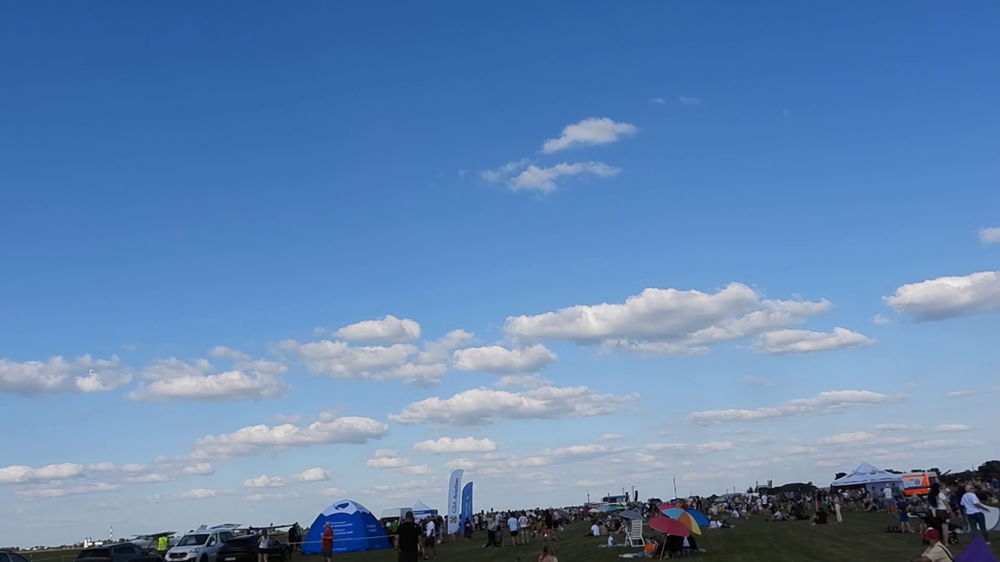

In [46]:
import cv2
import torch
import numpy as np
from ultralytics import YOLO
from PIL import Image
from IPython.display import display
import os

# CLIP 모델 로드
# CUDA가 사용 가능하면 GPU, 아니면 CPU를 사용합니다.
device = "cuda" if torch.cuda.is_available() else "cpu"
try:
    import clip
    model_clip, preprocess = clip.load("ViT-B/32", device=device)
except ImportError:
    print("CLIP 라이브러리가 설치되지 않았습니다. 'pip install clip' 또는 'pip install git+https://github.com/openai/CLIP.git'를 실행하세요.")
    exit()

# YOLO 모델 로드
model_yolo = YOLO("yolov8n.pt")

# 비디오 경로 설정
video_path = "FA-50.mp4" # 예시 비디오 파일
if not os.path.exists(video_path):
    print(f"비디오 파일 '{video_path}'를 찾을 수 없습니다. 경로를 확인해주세요.")
    exit()

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("비디오 파일을 열 수 없습니다.")
    exit()

# 검색 쿼리 설정
# 이 텍스트로 가장 유사한 프레임을 찾습니다.
query = "a photo of a person walking with a briefcase" # "서류 가방을 들고 걷는 사람 사진"
text_token = clip.tokenize([query]).to(device)

# CLIP의 텍스트 특징 벡터 계산
with torch.no_grad():
    text_feature = model_clip.encode_text(text_token)
    text_feature /= text_feature.norm(dim=-1, keepdim=True)

frame_index = 0
best_match_frame_index = -1
best_similarity = -1.0

# 비디오 프레임 단위 처리
print("비디오 분석 중...")
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # YOLO로 객체 탐지
    yolo_results = model_yolo.predict(source=frame, conf=0.5, verbose=False)
    # 클래스 이름을 가져와서 'person'이 있는지 확인합니다.
    detected_classes = [model_yolo.names[int(c)] for c in yolo_results[0].boxes.cls]

    # 'person' 클래스가 탐지되었을 경우에만 CLIP을 사용해 유사도 계산
    if "person" in detected_classes:
        # OpenCV 이미지를 PIL 이미지로 변환
        pil_image = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        # CLIP 모델 입력에 맞게 이미지 전처리
        image_input = preprocess(pil_image).unsqueeze(0).to(device)

        # CLIP의 이미지 특징 벡터 계산
        with torch.no_grad():
            image_feature = model_clip.encode_image(image_input)
            image_feature /= image_feature.norm(dim=-1, keepdim=True)

        # 텍스트-이미지 유사도 계산 (벡터 내적)
        similarity = (100.0 * text_feature @ image_feature.T).squeeze()
        current_similarity = similarity.item()

        # 현재까지 가장 유사한 프레임 찾기
        if current_similarity > best_similarity:
            best_similarity = current_similarity
            best_match_frame_index = frame_index
            print(f"새로운 베스트 프레임 발견: 프레임 {best_match_frame_index}, 유사도: {best_similarity:.2f}")

    frame_index += 1

cap.release()
cv2.destroyAllWindows()

# 최적의 프레임 시각화
print("\n가장 유사한 프레임:")
print(f"프레임 {best_match_frame_index}, 유사도: {best_similarity:.2f}")

cap = cv2.VideoCapture(video_path)
cap.set(cv2.CAP_PROP_POS_FRAMES, best_match_frame_index)
ret, best_frame = cap.read()
if ret:
    display(Image.fromarray(cv2.cvtColor(best_frame, cv2.COLOR_BGR2RGB)))
cap.release()

